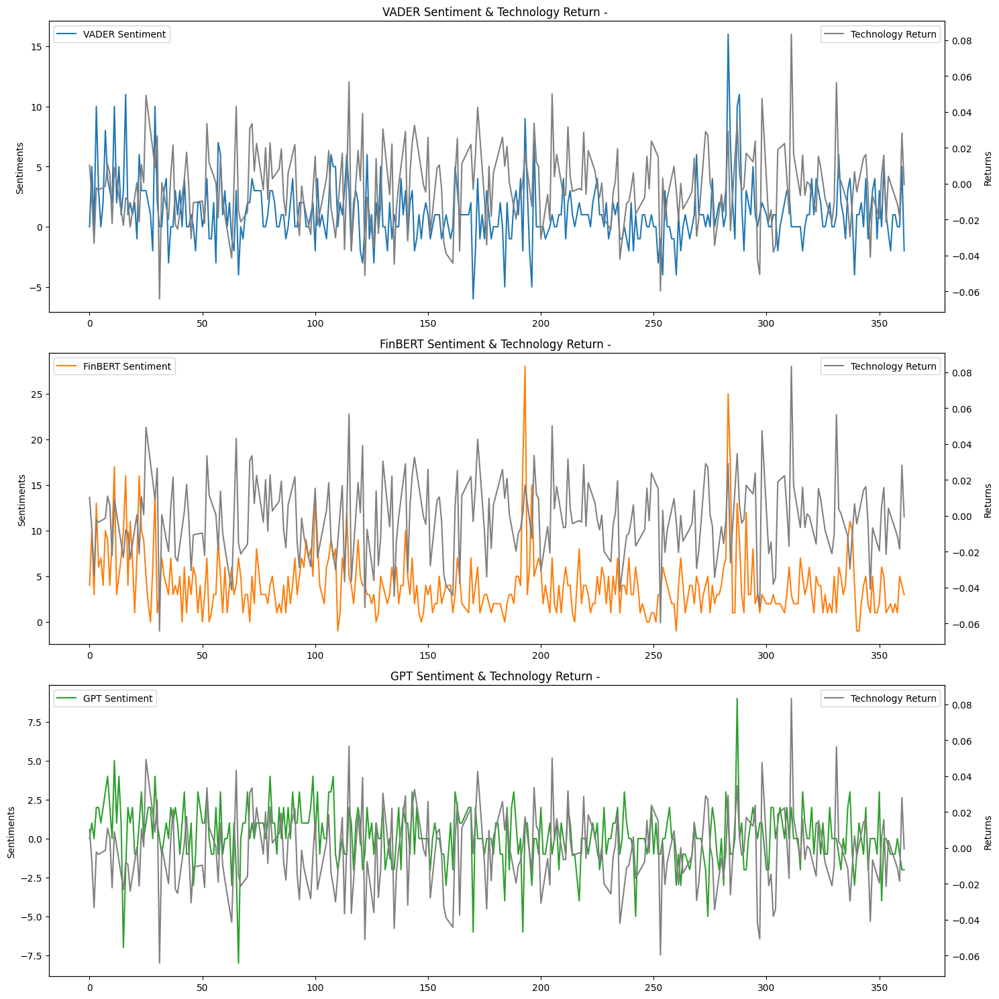

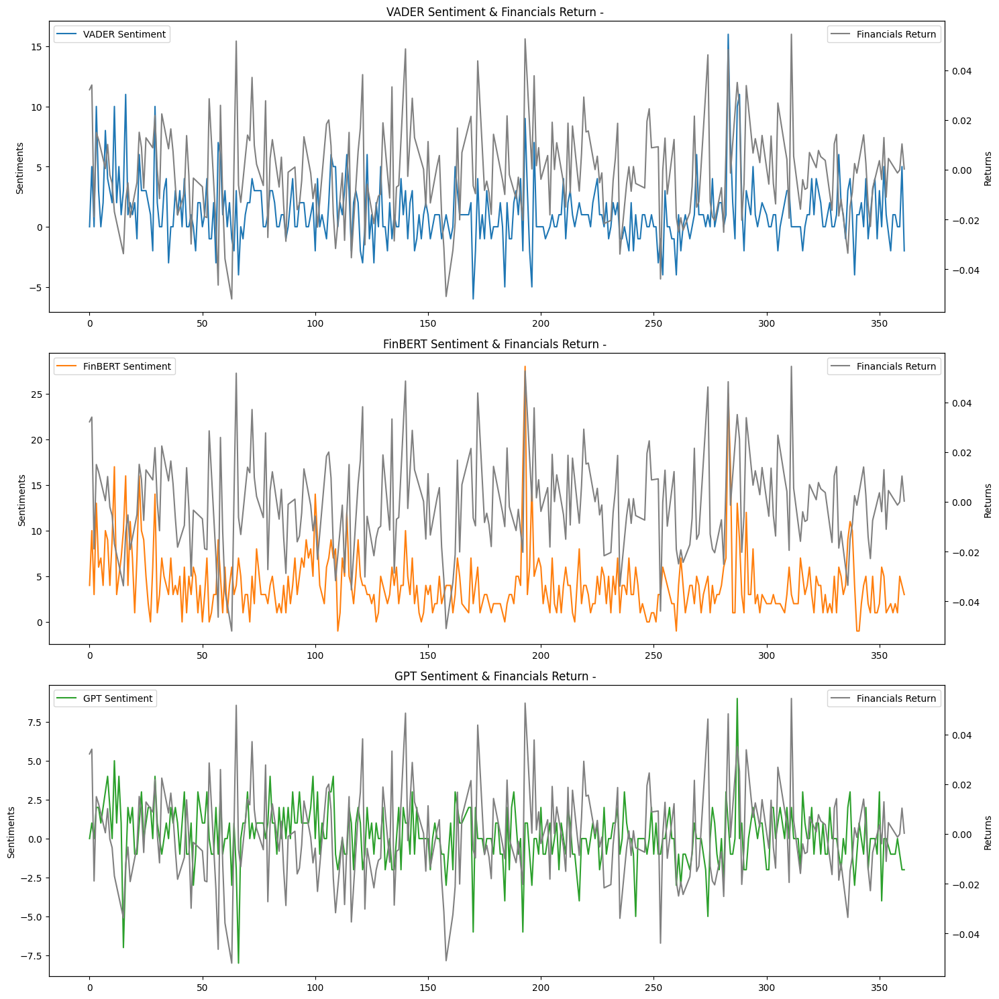

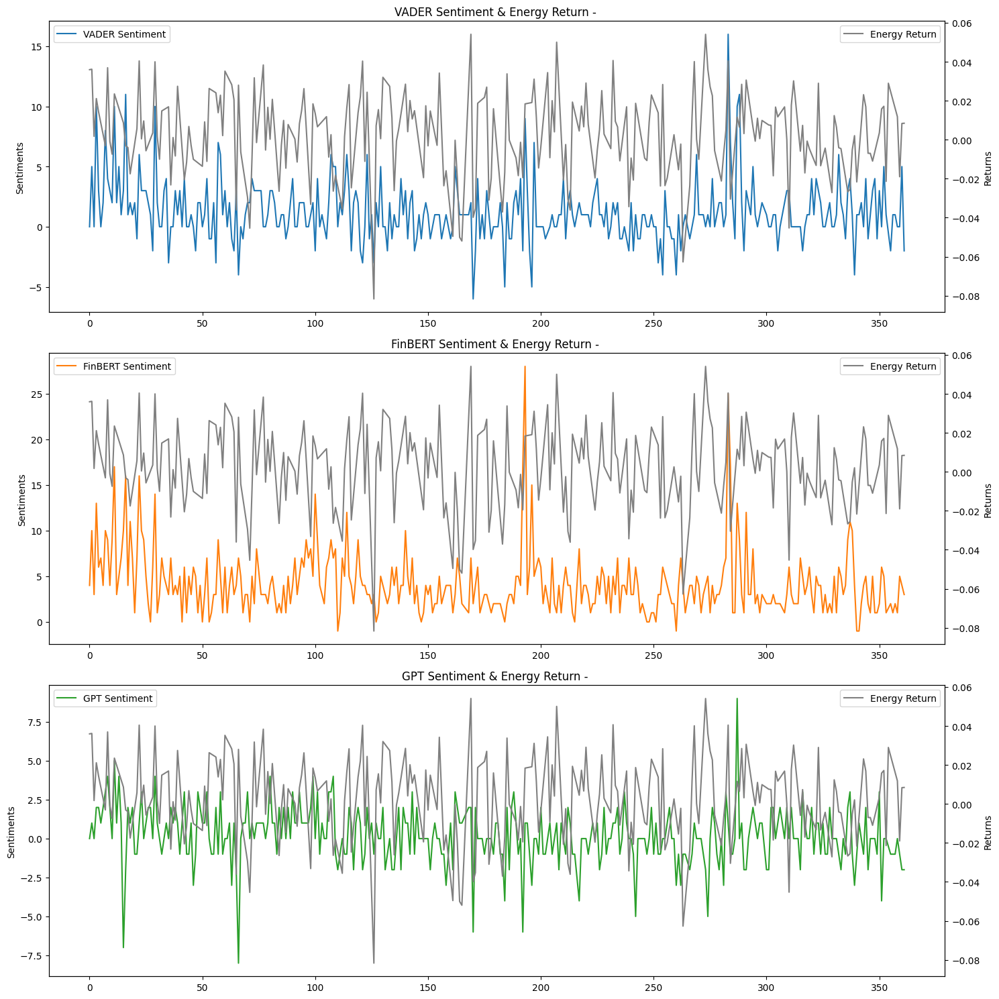

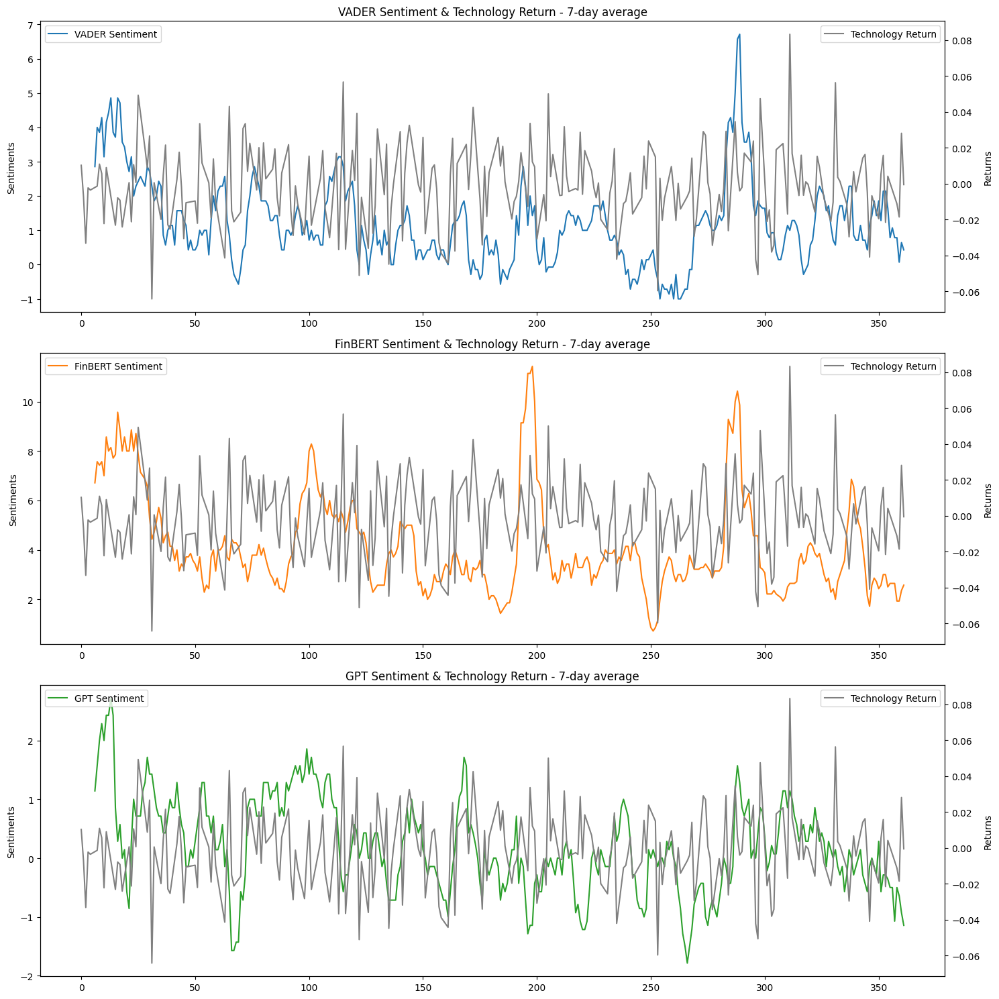

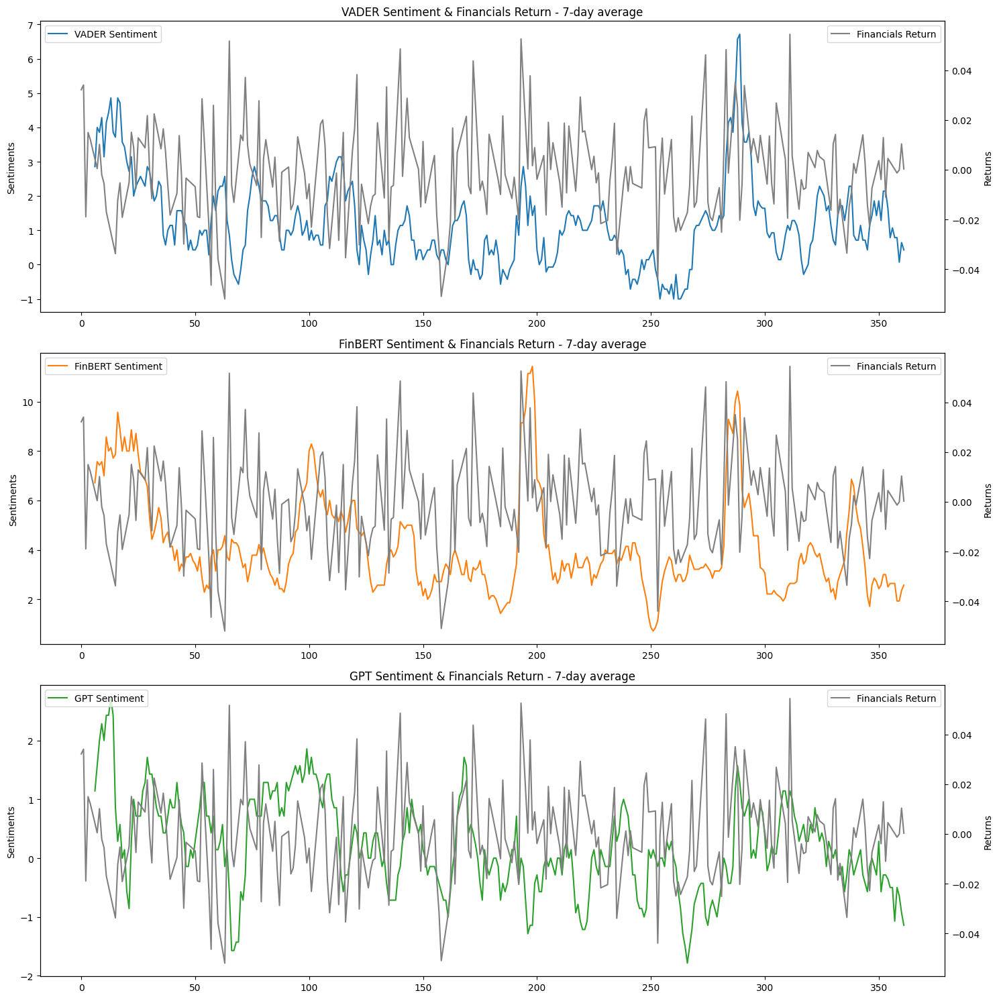

...

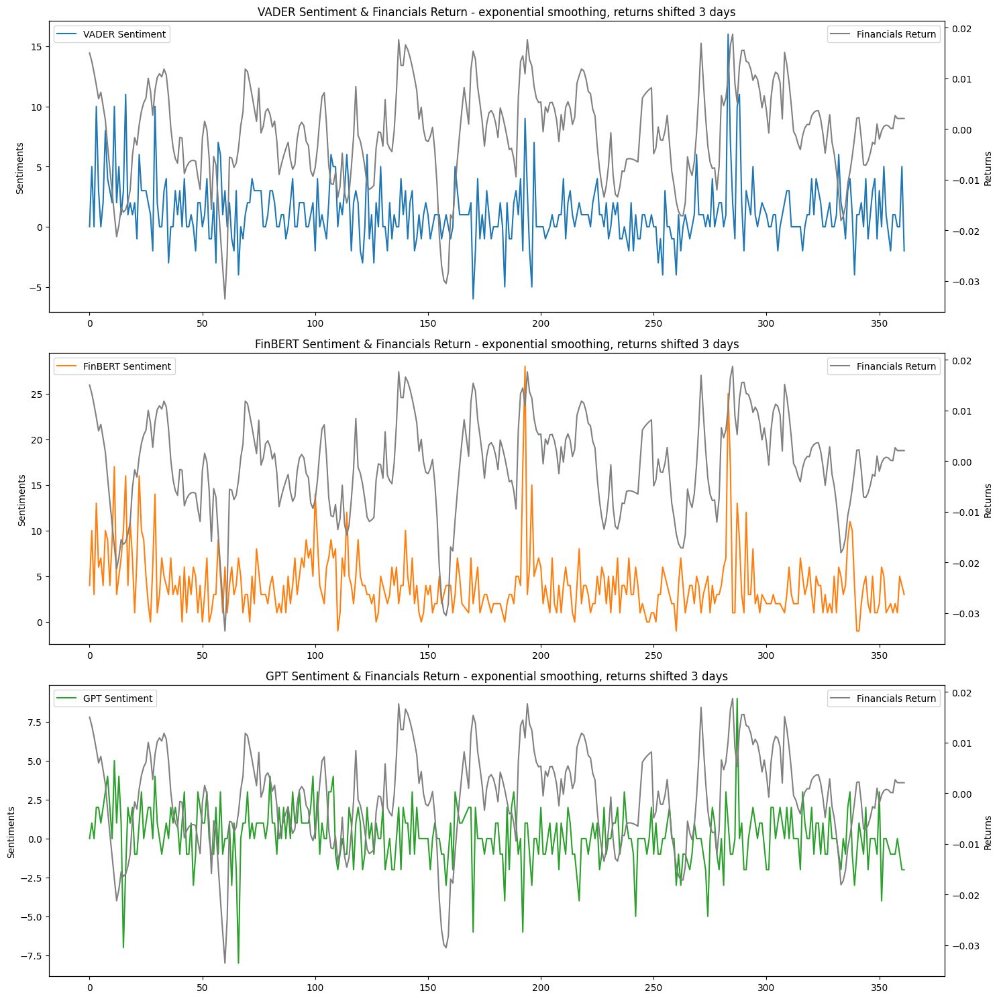

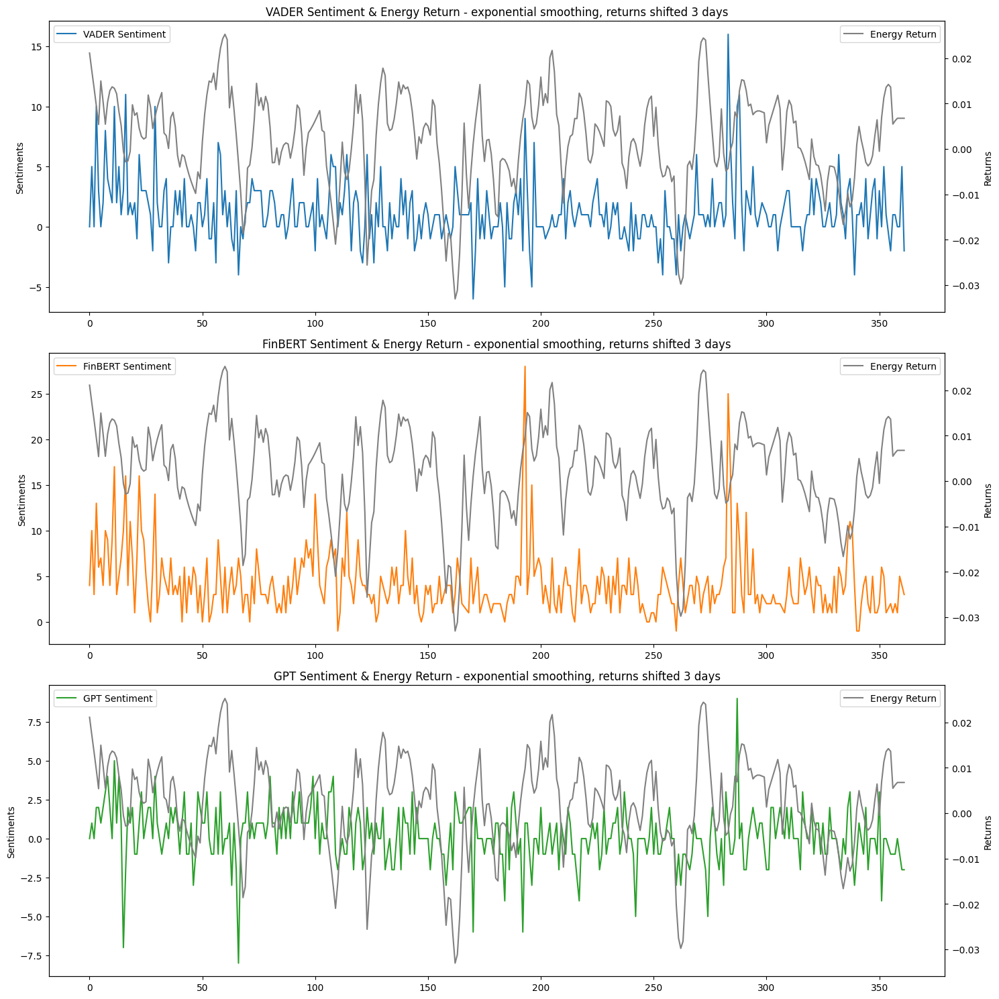

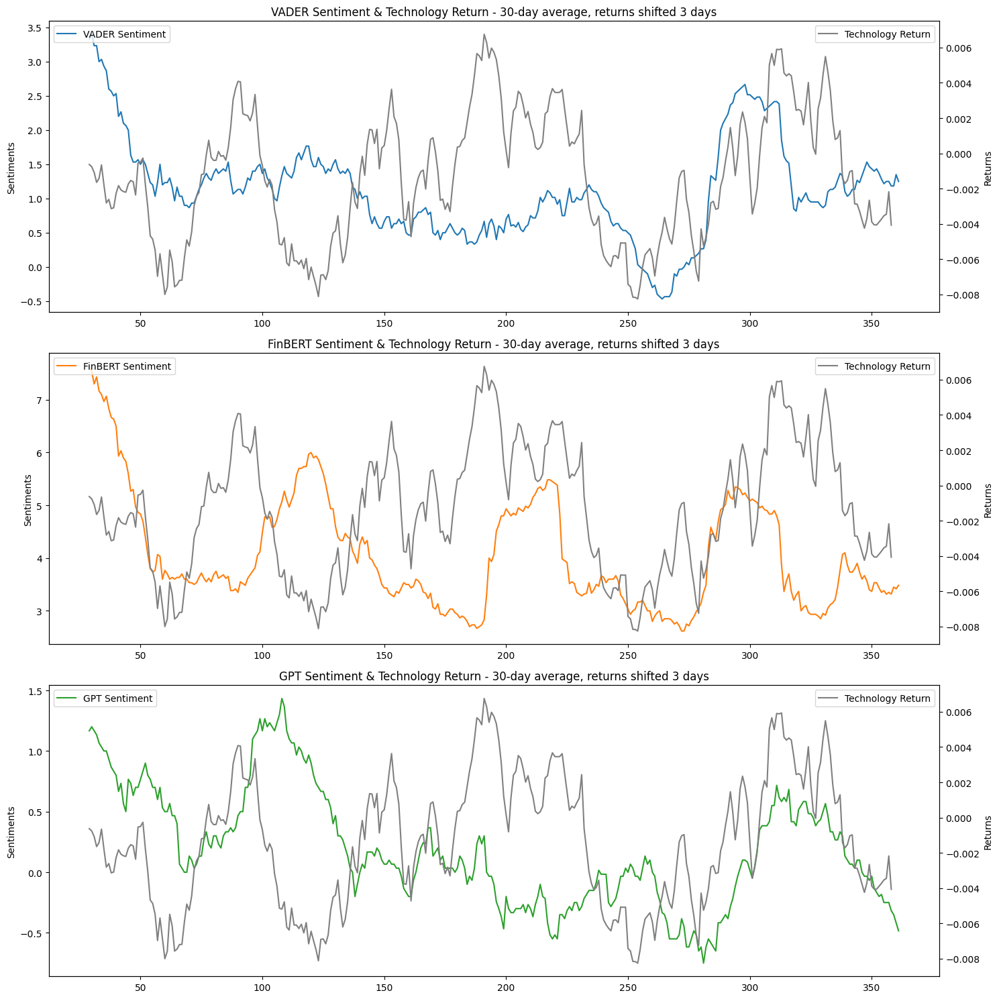

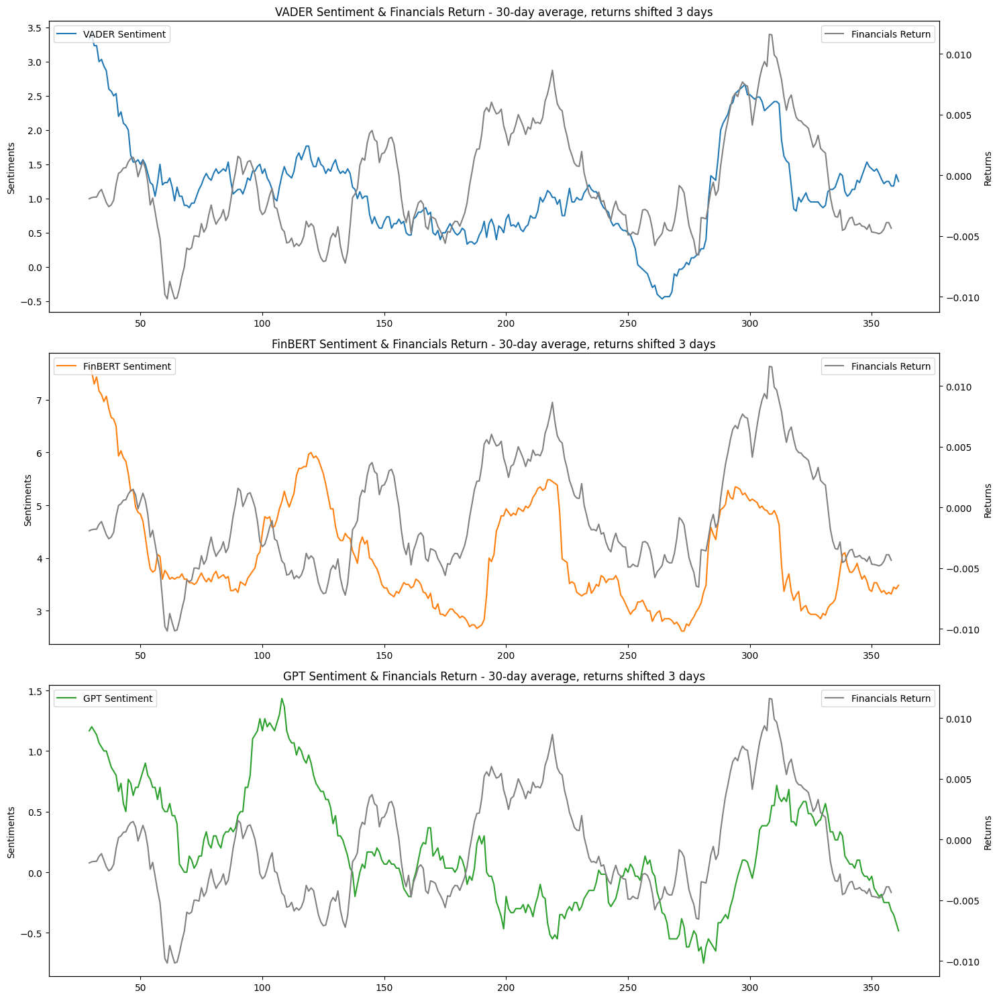

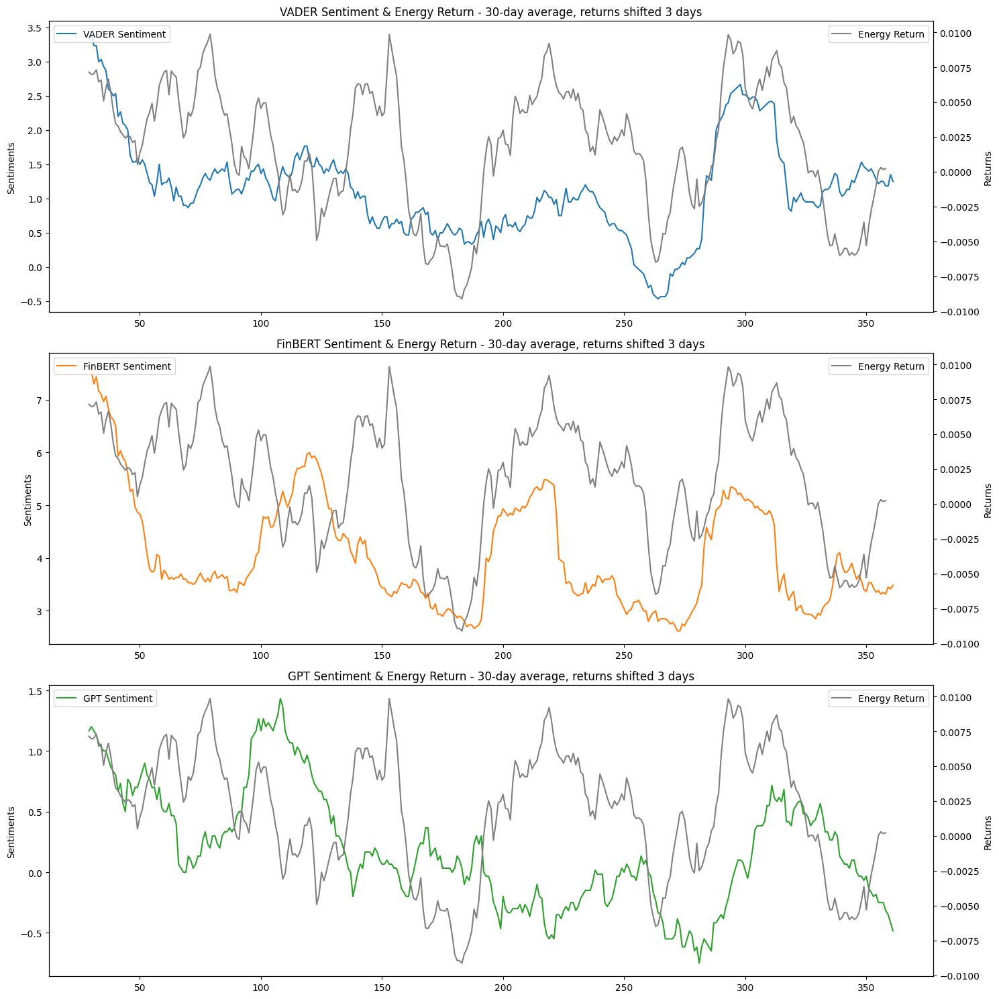

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Load data
sentiment_data_financials = pd.read_csv('Sentiment_Results_Financials_Sum.csv')
sentiment_data_energy = pd.read_csv('Sentiment_Results_Energy_Sum.csv')
sentiment_data_technology = pd.read_csv('Sentiment_Results_Technology_Sum.csv')
returns_data = pd.read_csv('Portfolio_Returns_Linear.csv')

# Define the sentiments and returns
sentiments = ['VADER Sentiment', 'FinBERT Sentiment', 'GPT Sentiment']
returns = ['Technology Return', 'Financials Return', 'Energy Return']

# Color palette
colors = list(mcolors.TABLEAU_COLORS.values())

# Function to plot sentiments and returns
def plot_graphs(sentiments, returns, sentiment_func=None, return_func=None, title_suffix=""):
    for return_col_or_series in returns:
        fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 15))
        for i, sentiment in enumerate(sentiments):
            ax1 = axes[i]
            ax2 = ax1.twinx()
            if sentiment_func:
                ax1.plot(sentiment_func(sentiment_data_financials[sentiment]), label=sentiment, color=colors[i])
            else:
                ax1.plot(sentiment_data_financials[sentiment], label=sentiment, color=colors[i])
                
            if return_func:
                if isinstance(return_col_or_series, str):  # If it's a string, assume it's a column name
                    ax2.plot(return_func(returns_data[return_col_or_series]), 'grey', label=return_col_or_series)
                else:  # Otherwise, assume it's a Series
                    ax2.plot(return_func(return_col_or_series), 'grey', label=return_col_or_series.name)
            else:
                if isinstance(return_col_or_series, str):  # If it's a string, assume it's a column name
                    ax2.plot(returns_data[return_col_or_series], 'grey', label=return_col_or_series)
                else:  # Otherwise, assume it's a Series
                    ax2.plot(return_col_or_series, 'grey', label=return_col_or_series.name)

            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            ax1.set_ylabel('Sentiments')
            ax2.set_ylabel('Returns')
            ax1.set_title(sentiment + " & " + (return_col_or_series if isinstance(return_col_or_series, str) else return_col_or_series.name) + " - " + title_suffix)
        plt.tight_layout()
        plt.show()


# Update return series to include names
shifted_returns = [returns_data[col].shift(-3) for col in returns]
for col, series in zip(returns, shifted_returns):
    series.name = col

# 1. Three sentiments and each return
plot_graphs(sentiments, returns)

# 2. 7-day averages
plot_graphs(sentiments, returns, sentiment_func=lambda x: x.rolling(7).mean(), title_suffix="7-day average")

# 3. 30-day averages
plot_graphs(sentiments, returns, sentiment_func=lambda x: x.rolling(30).mean(), title_suffix="30-day average")

# 4. Exponential smoothing
plot_graphs(sentiments, returns, sentiment_func=lambda x: x.ewm(span=7).mean(), title_suffix="exponential smoothing")

# 5. Returns shifted by 3 days
plot_graphs(sentiments, shifted_returns, title_suffix="returns shifted 3 days")

# 6. Like 5, but 7-day averages
plot_graphs(sentiments, [series.rolling(7).mean() for series in shifted_returns], title_suffix="7-day average, returns shifted 3 days")

# 7. Like 5, but exponential smoothing
plot_graphs(sentiments, [returns_data[col].shift(-3).ewm(span=7).mean() for col in returns], title_suffix="exponential smoothing, returns shifted 3 days")

# 8. 30-day averages, returns shifted by 3 days
plot_graphs(sentiments, [returns_data[col].shift(-3) for col in returns], lambda x: x.rolling(30).mean(), lambda x: x.rolling(30).mean(), title_suffix="30-day average, returns shifted 3 days")


